In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np # linear algebra
%matplotlib inline
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/test-images/alaska_range_beautiful_mountain_landscape-wallpaper-1920x1200.jpg
/kaggle/input/test-images/roi.jpg
/kaggle/input/test-images/1_0Jne3K4IeO7v58ItBrZBMA.jpg
/kaggle/input/test-images/odev_result_chicago.jpg
/kaggle/input/test-images/chicago_skyline_16x9.jpg
/kaggle/input/test-images/176084-3840x2160-desktop-4k-rainbow-wallpaper.jpg


# OpenCV Nedir? Ne için kullanılır?

OpenCV(Açık Kaynak Bilgisayar Görüsü), bilgisayarlı görüş ve görüntü işleme uygulamalarında kullanılan bir açık kaynak kütüphanedir. 
* Dijital görüntülerin işlenmesi, analizi ve manipülasyonu için geniş bir araç seti sunar.
* Optimize edilmiş algoritmalar ve veri yapıları içerir. Ayrıca GPU ile donanım hızlandırmayı destekler. Bu yüzden oldukça hızlıdır.

Kaynak: https://docs.opencv.org/4.x/

Daha detaylı bilgi için(algoritmalar, yaklaşımlar vb.): "Computer Vision: Algorithms and Applications", Richard Szeliski

- Bu defterde iki ana konu üzerine durulacak;
    1. Görüntü İşlemleri
    2. Video İşlemleri

 **Bu sadece lokal yani kendi bilgisayarınıza kurmak içindir. Kaggle zaten kendi içinde kütüphanelere erişebilir o yüzden kurmamız gerekmez.**

OpenCV kütüphanesini kurulumu;
* pip install opencv-python

# 1. Görüntü İşlemleri

* Görüntü Okuma ve Yazma
* Renk Dönüşümleri
* Çerçeveleme
* Geometrik işlemler

## Görüntü Okuma ve Yazma

In [2]:
image = cv.imread('/kaggle/input/test-images/alaska_range_beautiful_mountain_landscape-wallpaper-1920x1200.jpg')

In [3]:
print(image.shape, '\n', type(image), '\n', image[:,:,:5])

(1200, 1920, 3) 
 <class 'numpy.ndarray'> 
 [[[203 179 151]
  [202 178 150]
  [201 177 149]
  ...
  [203 188 185]
  [204 189 186]
  [205 190 187]]

 [[204 178 148]
  [202 178 148]
  [204 178 148]
  ...
  [204 189 186]
  [204 189 186]
  [205 190 187]]

 [[209 181 150]
  [207 182 150]
  [209 181 150]
  ...
  [204 189 186]
  [205 190 187]
  [205 190 187]]

 ...

 [[ 19  40  18]
  [ 26  48  24]
  [ 18  43  17]
  ...
  [150 166 155]
  [149 171 159]
  [153 178 164]]

 [[ 36  64  35]
  [ 31  59  29]
  [ 29  54  26]
  ...
  [147 163 152]
  [145 167 155]
  [155 181 168]]

 [[ 34  65  32]
  [ 43  74  41]
  [ 38  64  34]
  ...
  [147 164 155]
  [139 161 149]
  [143 169 156]]]


### Resmi Görüntüleme

OpenCV kütüphanesinin `cv.imshow()` metodu da resimleri açmak için kullanılır fakat Kaggle içerisinden pencere açamıyoruz. Bu yüzden `matplotlib` kütüphanesinin `plt.imshow()` metodunu kullanıyoruz. Fakat burada bilinmesi gereken `plt.imshow()` metodu bir `matplotlib.pyplot` figürünü oluşturur ve `plt.show` adında başka bir metot ile bu görüntü gösterilir. Burada `plt.show()` metodunu kullanmamıza rağmen resmin gözükme sebebi Kaggle ve jupyter notebook içerisinde bir hücrenin en son satırındaki verinin çıktı olarak gösterilmesini sağlayan bir sistem vardır.

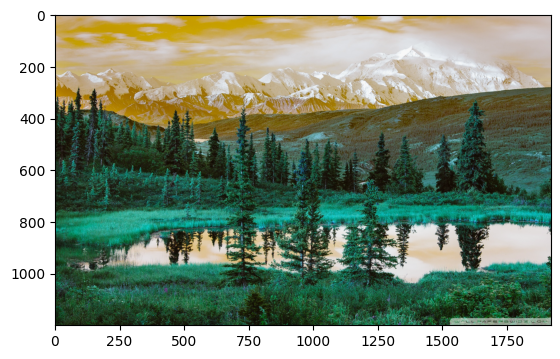

In [4]:
plt.imshow(image)

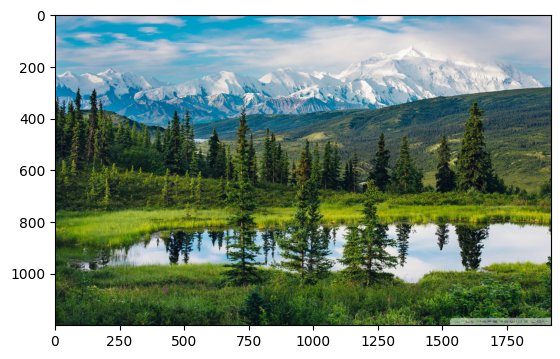

In [5]:
plt.imshow(cv.cvtColor(image,cv.COLOR_BGR2RGB)) # Renkleri tersine çevirme

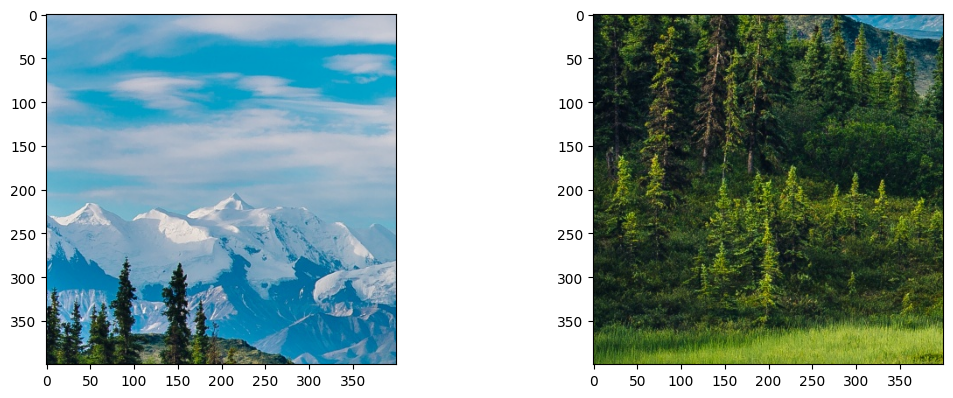

In [6]:
image2 = image[:400,:400]
image3 = image[400:800,0:400]
plt.figure(figsize=(20,10))
plt.subplot(231)
plt.imshow(cv.cvtColor(image2, cv.COLOR_BGR2RGB))
plt.subplot(232)
plt.imshow(cv.cvtColor(image3, cv.COLOR_BGR2RGB))

**Pratik**: Kendi istediğiniz bir resmin istediğiniz bir parçasını bir değişkene kaydedin. (Kolay)

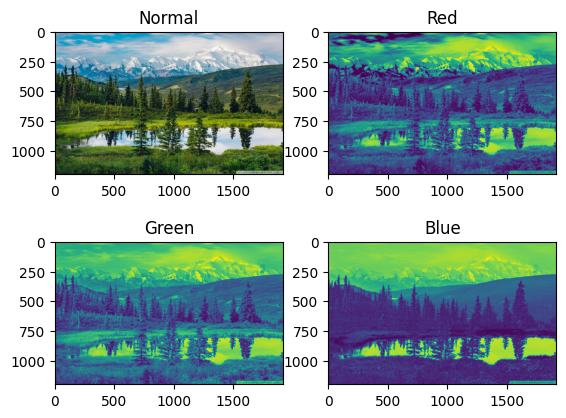

In [7]:
image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)
image_r = image_rgb[:,:,0]
image_g = image_rgb[:,:,1]
image_b = image_rgb[:,:,2]
plt.figure(figsize=(10,5))
plt.subplot(231)
plt.imshow(image_rgb)
plt.title('Normal')
plt.subplot(232)
plt.imshow(image_r)
plt.title('Red')
plt.subplot(234)
plt.imshow(image_g)
plt.title('Green')
plt.subplot(235)
plt.imshow(image_b)
plt.title('Blue')
plt.show()

Üstte kullandığımız resim çoğunlukla yeşil renkten oluştuğu için sadece diğer renk kanallarını kullansak bile yeşile yakınsıyor.
Alttaki görselde ise renk kanallarının daha düzgün dağıldığını görebiliriz. Hala, kırmızı rengini tam alamamızın sebebi resimde yoğunluğunun az olmasıdır. 

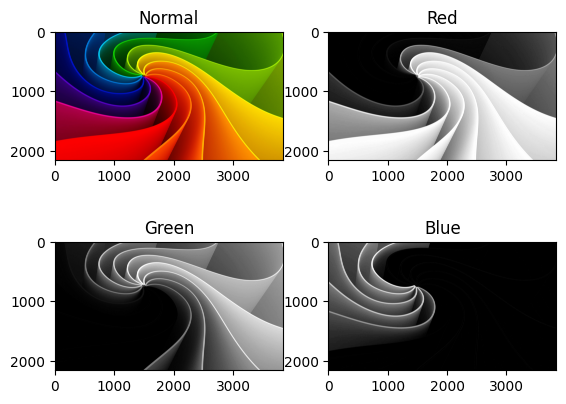

In [8]:
image_rainbow = cv.imread('/kaggle/input/test-images/176084-3840x2160-desktop-4k-rainbow-wallpaper.jpg')
image_rgb = cv.cvtColor(image_rainbow, cv.COLOR_BGR2RGB)
image_r = image_rgb[:,:,0]
image_g = image_rgb[:,:,1]
image_b = image_rgb[:,:,2]
plt.figure(figsize=(10,5))
plt.subplot(231)
plt.imshow(image_rgb)
plt.title('Normal')
plt.subplot(232)
plt.imshow(image_r, cmap='gray')
plt.title('Red')
plt.subplot(234)
plt.imshow(image_g, cmap='gray')
plt.title('Green')
plt.subplot(235)
plt.imshow(image_b, cmap='gray')
plt.title('Blue')
plt.show()

In [9]:
%mkdir /kaggle/working/test

In [10]:
cv.imwrite("/kaggle/working/test/alaska_range_beautiful_mountain_landscape-wallpaper-400x400.jpg",image2)

True

## Renk Dönüşümleri

* Renk Modellerinin İncelenmesi
* Renk Dönüşüm Fonksiyonları
* Renk Ayıklama ve Thresholding
* Histogramlar ve Renk İstatistikleri

### Renk Modellerinin İncelenmesi

1. **RGB (Kırmızı, Yeşil, Mavi):**
   - RGB modeli, renklerin kırmızı (R), yeşil (G) ve mavi (B) bileşenlerinin kombinasyonu ile temsil edildiği en yaygın renk modelidir.
   - Her bir bileşen 0 ile 255 arasında değer alır.
   - Örneğin, beyaz renk (255, 255, 255), siyah renk (0, 0, 0) ve kırmızı renk (255, 0, 0) gibi temel renkleri ifade eder.
   

2. **HSV (Ton, Doyma, Parlaklık):**
   - HSV modeli, renkleri ton (H), doygunluk (S) ve parlaklık (V) bileşenleri ile temsil eder.
   - Ton, renklerin temel rengi (örneğin, kırmızı, sarı, mavi) belirtir.
   - Doyma, renklerin canlılık veya solukluğunu belirtir.
   - Parlaklık, rengin parlaklık seviyesini ifade eder.
   - HSV, renk değişimlerini daha insan algısına benzer bir şekilde temsil etmek için kullanılır.
   

3. **Lab (Lüminans, A ve B bileşenleri):**
   - Lab modeli, renkleri Lüminans (L), A ve B bileşenleri ile temsil eder.
   - Lüminans, renklerin parlaklık seviyesini belirtir.
   - A ve B bileşenleri ise renklerin yeşil-magenta (A) ve mavimsi-sarı (B) bileşenlerini ifade eder.
   - Lab modeli renklerin insan algısına daha yakın bir temsili için kullanılır.
   

4. **Grayscale (Siyah-Beyaz):**
   - Grayscale modeli, renklerin sadece parlaklık seviyesini temsil eder.
   - Her piksel tek bir değerle temsil edilir ve bu değer, 0 (siyah) ile 255 (beyaz) arasında değişir.
   - Grayscale, siyah-beyaz veya gri tonlamalı görüntüler için kullanılır.
   

Bu renk modelleri, farklı uygulamalarda kullanılır ve görüntü işleme işlemlerinde renk analizi ve manipülasyonları için temel sağlar. OpenCV ve diğer görüntü işleme kütüphaneleri, bu renk modelleri arasında geçiş yapma ve renk dönüşümleri gerçekleştirme işlemlerini kolaylaştıran işlevler sunar. Renk modellerini anlamak, görüntü işleme uygulamalarında renklerle çalışırken çok önemlidir.

### Renk Dönüşüm Fonksiyonları

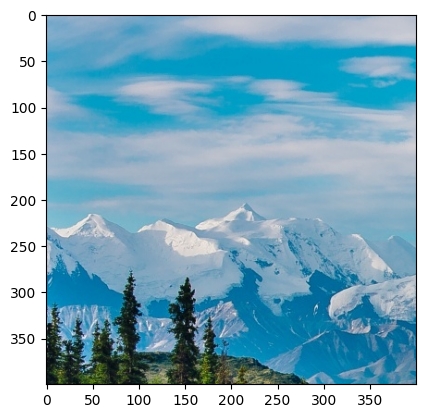

In [11]:
# RGB'den dönüşüm yapacağımız için resmi BGR den RGB şekline dönüştürme işlemi
image = cv.imread('/kaggle/working/test/alaska_range_beautiful_mountain_landscape-wallpaper-400x400.jpg')
image = cv.cvtColor(image,cv.COLOR_BGR2RGB)
plt.imshow(image)

In [12]:
# RGB'den HSV'ye Dönüşüm
image_hsv = cv.cvtColor(image, cv.COLOR_RGB2HSV)
cv.imwrite('/kaggle/working/test/image_hsv.jpg', image_hsv)

True

In [13]:
# HSV'den RGB'ye Dönüşüm
image_hsv = cv.imread("/kaggle/working/test/image_hsv.jpg")
image_rgb = cv.cvtColor(image_hsv, cv.COLOR_HSV2RGB)

In [14]:
# RGB'den Grayscale'e Dönüşüm
image_gray = cv.cvtColor(image, cv.COLOR_RGB2GRAY)
cv.imwrite('/kaggle/working/test/image_gray.jpg', image_gray)

True

In [15]:
# RGB'den Lab'a Dönüşüm
image_lab = cv.cvtColor(image, cv.COLOR_RGB2Lab)
cv.imwrite('/kaggle/working/test/image_lab.jpg', image_lab)

True

In [16]:
image_gray, image_gray.shape

(array([[173, 172, 171, ..., 186, 187, 186],
        [172, 172, 172, ..., 187, 187, 186],
        [175, 175, 175, ..., 188, 188, 187],
        ...,
        [ 17,  20,  24, ..., 134, 124, 110],
        [ 17,  16,  21, ..., 116, 115, 109],
        [ 11,  14,  23, ..., 115, 121, 120]], dtype=uint8),
 (400, 400))

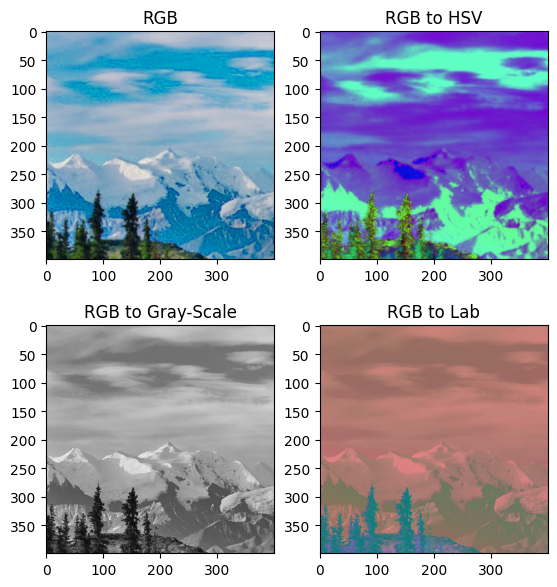

In [17]:
plt.figure(figsize=(10,7))
plt.subplot(231)
plt.imshow(image_rgb)
plt.title('RGB')
plt.subplot(232)
plt.imshow(image_hsv)
plt.title('RGB to HSV')
plt.subplot(234)
plt.imshow(image_gray,cmap='gray', vmin=0, vmax=255) # cvtColor ile yaptığımız dönüşümü matplotun düzgün haritalaması için kullanılıyor.
plt.title('RGB to Gray-Scale')
plt.subplot(235)
plt.imshow(image_lab)
plt.title('RGB to Lab')
plt.show()

### Renk Ayıklama ve Thresholding

1. **Kontrast Artırma:** Ayıklama, nesneleri veya özellikleri arka planlarından ayırmak için kontrastı artırır. Bu, nesnelerin daha belirgin hale gelmesini sağlar ve tespit sürecini kolaylaştırır.

2. **Gürültü Azaltma:** Ayıklama işlemi, görüntüdeki gürültüyü azaltabilir. Bu, nesne tespiti sırasında yanlış pozitif sonuçları en aza indirir.

3. **Özelliklerin Belirginleştirilmesi:** Ayıklama, belirli özellikleri veya desenleri belirginleştirmek için kullanılabilir. Örneğin, kenar tespiti için ayıklama sıkça kullanılır.

#### Kontrast Artırma

(-0.5, 1919.5, 1199.5, -0.5)

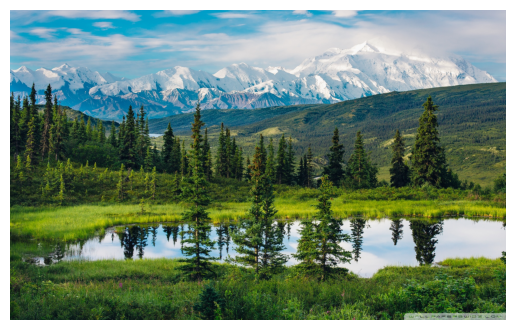

In [18]:
# Öncelikle orijinal renkli resmi okuyoruz.
image = cv.imread('/kaggle/input/test-images/alaska_range_beautiful_mountain_landscape-wallpaper-1920x1200.jpg')
plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
plt.axis('off')

- cv2.convertScaleAbs() işlevi, belirtilen alpha ve beta değerlerini kullanarak girdi görüntüsünün kontrastını ve parlaklığını ayarlar ve bu işlem sonucunda ayarlanmış bir görüntüyü döndürür.

Aşağıdaki alpha ve beta değerlerinde ile açıklamada belirtildiği gibi istediğiniz şekilde oynama yapabilirsiniz.

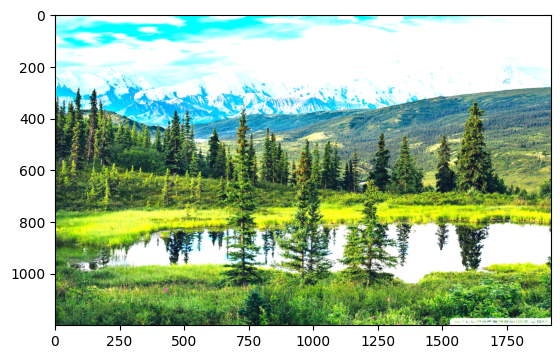

In [19]:
alpha = 1.7  # Kontrast artırma faktörü (1'den büyük bir değer)
beta = 0    # Parlaklık artırma değeri (0 ile 100 arasında bir değer)
adjusted_image = cv.convertScaleAbs(image, alpha=alpha, beta=beta)
plt.imshow(cv.cvtColor(adjusted_image, cv.COLOR_BGR2RGB))

#### Gürültü Azaltma (Image Smoothing)

Görüntüdeki gürültüyü azaltmanın temel yollarından biri, görüntüdeki küçük dalgalanmaları veya anormallikleri gidermek için bir düzeltme işlemi uygulamaktır. 
1. Averaging
2. Gaussian Blurring
3. Median Blurring
4. Bilateral Filtering

##### Averaging

Averaging, bir pikselin yeni değerini, kendisi ve çevresindeki piksellerin değerlerinin ortalamasını alarak hesaplar. Bu yüzden daha bulanık ama gürültüsü daha düşük bir resim elde ederiz.

- `kernel_size` filtreleme boyutunu belirtir. Ne kadar büyük bir boyut girilse o kadar yumuşatma(bulanıklaştırma) olur. Fakat boyutun büyük olması resimdeki ayrıntıların azalmasına neden olur.

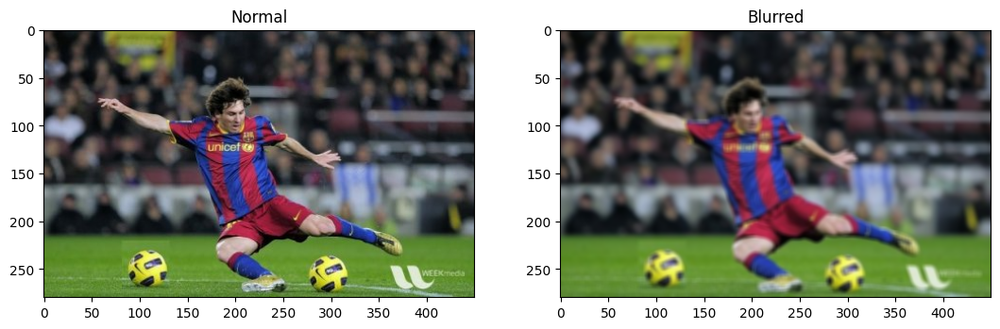

In [20]:
img_avg = cv.imread('/kaggle/input/test-images/roi.jpg')
img_avg = cv.cvtColor(img_avg, cv.COLOR_BGR2RGB)
plt.figure(figsize = (20,10))
plt.subplot(231)
plt.imshow(img_avg)
plt.title('Normal')
plt.subplot(232)
kernel_size = (5,5)
img_avg = cv.blur(img_avg,kernel_size)
plt.title('Blurred')
plt.imshow(img_avg)

##### Gaussian Blurring

Gaussian blurring, bir görüntü üzerindeki her pikselin çevresindeki piksellerin ağırlıklı ortalamasını hesaplayarak çalışır. Ağırlıklar, Gauss dağılımı tarafından belirlenir, bu da görüntünün merkezinden uzaklaştıkça ağırlıkların azaldığı bir dağılımı ifade eder.
1. Her piksel için bir Gaussian çekirdek (kernel) hesaplanır. Bu çekirdek, Gaussian fonksiyonunun 2D varyasyonudur ve birçok piksele yayılan bir ağırlık dağılımını temsil eder.

2. Her pikselin yeni değeri, Gaussian çekirdek içindeki piksellerin orijinal değerleri ve çekirdeğin ağırlıklarının çarpımının toplamıdır. Bu işlem, her pikselin çevresindeki piksellerin ağırlıklı ortalamasını hesaplar.

Burada;
- `sigma` değeri standart sapmayı belirtir. Ne kadar düzgünleştirme yapılacağının değerini tutar. Örneğin resim gürültülü ise daha fazla düzgünleştirme yapmak gerekebilir.

Ayrıca 'Averaging' ile bulanıklaştırmadan farklı olarak dairesel bir şekilde bulanıklaştırır. İki resmi karşılaştırırsanız, alttaki resimde üniformadaki yazıların daha rahat okunabilir durumda olduğunu göreceksiniz.

Text(0.5, 1.0, 'Blurred')

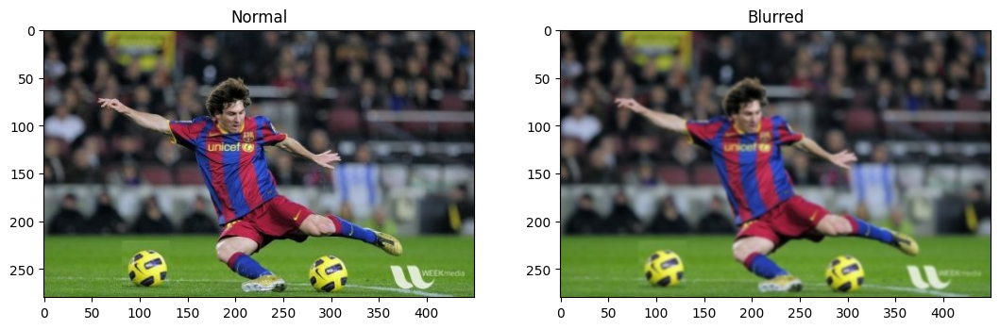

In [21]:
img_gauss = cv.imread('/kaggle/input/test-images/roi.jpg')
img_gauss = cv.cvtColor(img_gauss, cv.COLOR_BGR2RGB)
plt.figure(figsize = (20,10))
plt.subplot(231)
plt.imshow(img_gauss)
plt.title('Normal')
plt.subplot(232)
kernel_size = (5,5)
sigma = 0
img_gauss = cv.GaussianBlur(img_gauss, kernel_size, sigma)
plt.imshow(img_gauss)
plt.title('Blurred')

##### Median Blurring

Median blurring (Medyan bulanıklama), bir görüntüyü düzgünleştirmek ve gürültüyü azaltmak için kullanılan bir filtreleme tekniğidir. Median blurring, görüntü üzerindeki her pikselin etrafındaki piksellerin sıralanmış (sıralı) bir listesinden ortanca (median) değeri seçerek çalışır.

Median blurring işlemi şu adımları içerir:

1. Her pikselin etrafında belirli bir pencere veya çekirdek (kernel) boyutunda bir bölge seçilir. Bu bölgedeki tüm pikseller bir listeye koyulur.

2. Bu listedeki pikseller sıralanır.

3. Orta piksel (ortanca) bu sıralı listeden seçilir.

4. Orta piksel, orijinal pikselin yeni değeri olarak atanır.

Median blurring, özellikle tuz-biber gürültüsü gibi türdeki rastgele gürültüleri gidermek için etkilidir. Çünkü median değeri, herhangi bir en yüksek veya en düşük değeri etkisiz hale getirir ve bu sayede gürültüyü azaltırken görüntünün köşeleri veya kenarları üzerinde daha iyi koruma sağlar.

Text(0.5, 1.0, 'Blurred')

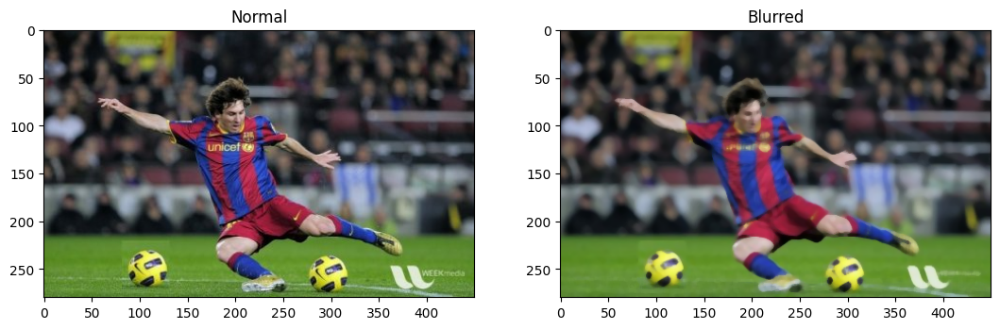

In [22]:
img_med = cv.imread('/kaggle/input/test-images/roi.jpg')
img_med = cv.cvtColor(img_med, cv.COLOR_BGR2RGB)
plt.figure(figsize = (20,10))
plt.subplot(231)
plt.imshow(img_med)
plt.title('Normal')
plt.subplot(232)
kernel_size = 5
img_med = cv.medianBlur(img_med,kernel_size)
plt.imshow(img_med)
plt.title('Blurred')

##### Bilateral Blurring

Bilateral blurring (bilateral bulanıklama), bir görüntüyü düzgünleştirmek ve aynı zamanda kenarları korumak için kullanılan gelişmiş bir filtreleme tekniğidir. Bu tekniğin önemli bir özelliği, hem gürültüyü azaltma hem de önemli kenarları koruma yeteneği sunmasıdır.

Bilateral blurring işlemi şu adımları içerir:

1. Her pikselin etrafında belirli bir pencere veya çekirdek (kernel) boyutunda bir bölge seçilir.

2. Seçilen bölge içindeki pikseller, hem uzaklık (mesafe) hem de benzerlik (intensite) faktörleri üzerinden filtrelenir. Bu iki faktör, çevresel piksellerin orijinal piksel ile ne kadar benzer olduğunu ve ne kadar uzakta olduğunu belirler.

3. Filtreleme işlemi, her pikselin yeni değerini hesaplarken, ağırlıklı bir ortalama alarak yapılır. Bu ağırlıklı ortalama, uzaklık ve benzerlik faktörlerine dayalıdır.

Sonuç olarak, bilateral blurring gürültüyü azaltırken keskin kenarları korur ve bu nedenle görüntünün daha doğal ve net görünmesini sağlar. Bu yöntem, özellikle portre fotoğraflarının düzeltilmesi ve belirli görsel efektlerin uygulanması gibi uygulamalarda kullanılır.

`d`, pikseller arasındaki uzaklık threshold'unu(eşik) belirtir. `sigmaColor`, benzerlik faktörünün hesaplanmasında kullanılan bir değerdir. `sigmaSpace`, uzaklık faktörünün hesaplanmasında kullanılır ve etkili bir çekirdek boyutunu kontrol eder. Bu değerleri uygulamanızın gereksinimlerine göre ayarlayabilirsiniz.

Text(0.5, 1.0, 'Blurred')

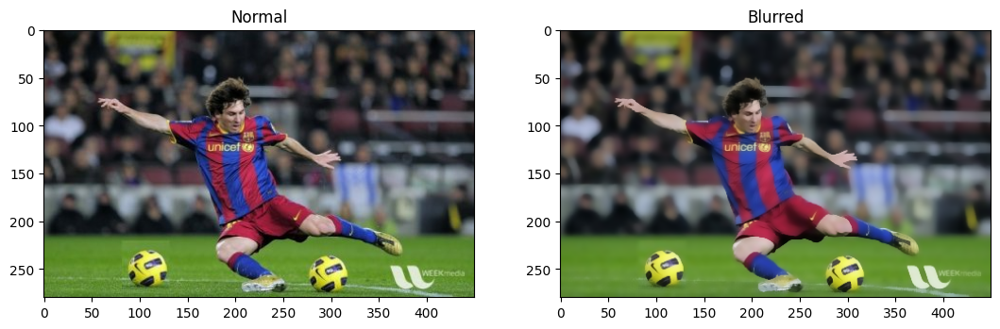

In [23]:
img_bil = cv.imread('/kaggle/input/test-images/roi.jpg')
img_bil = cv.cvtColor(img_bil, cv.COLOR_BGR2RGB)
plt.figure(figsize = (20,10))
plt.subplot(231)
plt.imshow(img_bil)
plt.title('Normal')
plt.subplot(232)
d = 9
sigmaColor = 75
sigmaSpace = 75 
img_bil = cv.bilateralFilter(img_bil, d,sigmaColor,sigmaSpace)
plt.imshow(img_bil)
plt.title('Blurred')

Farkettiğiniz üzere oyuncunun formasının kırışıklıkları fazlasıyla azaldı ve biraz soluk bir renge büründü. Fakat kenarlarda bir kaybolma olmadı.

#### Özelliklerin Belirginleştirilmesi

- OpenCV ile renk ayıklama ve thresholding kullanarak resimdeki özellikleri belirginleştirebilirsiniz. Bu yöntem, resimde belirli renk bölgelerini vurgulamak veya belirli parlaklık eşiklerini kullanarak nesneleri ayırmak için kullanışlıdır.

- Renk ayıklama ve thresholding, görüntülerdeki belirli özellikleri veya nesneleri belirginleştirmek ve izole etmek için yaygın olarak kullanılan tekniklerdir. Özellikle görüntü işleme ve nesne algılama uygulamalarında sıkça kullanılırlar.

`cv2.THRESH_BINARY` bayrağını kullanarak yapılan binary thresholding işlemidir. Yani, eşik değerini aşan pikseller 255 olarak ayarlanırken, eşik değerini aşmayan pikseller 0 olarak ayarlanır. Bu, nesnelerin beyaz (255) ve arka planın siyah (0) olarak belirginleştirilmesi anlamına gelir.

`mask` ile ayarladığımız maske belirlediğimiz renk aralığı dışında kalan renkleri siyah olarak alır. Bu sayede sadece istediğimiz renk aralığını görürürüz.

Text(0.5, 1.0, 'Thresholded')

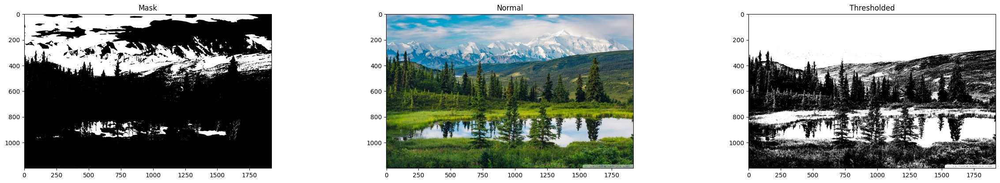

In [24]:
img_highlighted = cv.imread('/kaggle/input/test-images/alaska_range_beautiful_mountain_landscape-wallpaper-1920x1200.jpg')
img_normal = cv.cvtColor(img_highlighted,cv.COLOR_BGR2RGB)
img_hsv = cv.cvtColor(img_highlighted, cv.COLOR_BGR2HSV)
img_gray = cv.cvtColor(img_highlighted, cv.COLOR_RGB2GRAY)

# Renk aralığı belirleme - Burada mavi renk aralığında olanlar için bir aralık seçtik (HSV renk uzayında bu aralık maviye denk gelir)
lower_color = np.array([90, 50, 50])
upper_color = np.array([130, 255, 255])


# Renk ayıklama için bir maske oluşturma
mask = cv.inRange(img_hsv, lower_color, upper_color)

# Thresholding için bir eşik değeri belirleme
threshold_value = 90
_, img_thresholded = cv.threshold(img_gray, threshold_value, 255, cv.THRESH_BINARY)

plt.figure(figsize = (30,10))
plt.subplot(231)
plt.imshow(mask, cmap='gray')
plt.title('Mask')
plt.subplot(232)
plt.imshow(img_normal)
plt.title('Normal')
plt.subplot(233)
plt.imshow(img_thresholded, cmap='gray') # plt'nin siyah-beyaz görüntü oluşturabilmesi için
plt.title('Thresholded')

In [25]:
mask, mask.shape # Görüldüğü gibi `mask` 2 boyutlu dolayısıyla siyah beyaz gösterim yapılması mantıklı oluyor.

(array([[255, 255, 255, ...,   0,   0,   0],
        [255, 255, 255, ...,   0,   0,   0],
        [255, 255, 255, ...,   0,   0,   0],
        ...,
        [  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0],
        [  0,   0,   0, ...,   0,   0,   0]], dtype=uint8),
 (1200, 1920))

Ayrıca maskeleme ile resmin sadece belli bir renk aralığında olan kısmını alabiliriz. `bitwise_and()` methodu aslında mantıktan alışık olduğumuz 'and'(ve) işlemini maskenin seçmiş olduğu aralığı anlayabilmek için resmin pikselleriyle maske arasında uygular. Örneğin, 'and' işleminin sonucu 1 çıkarsa pikseli alır.

Text(0.5, 1.0, 'Orijinal')

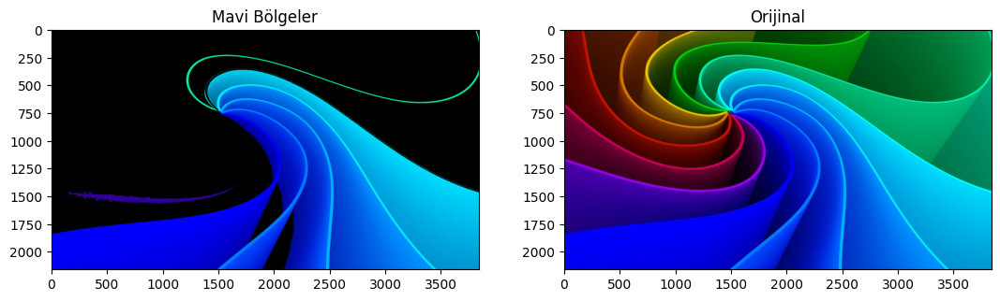

In [26]:
img_mask = cv.imread('/kaggle/input/test-images/176084-3840x2160-desktop-4k-rainbow-wallpaper.jpg')

# Mavi renk için eşikleme değerlerini belirleyin (BGR için mavi renk aralığı)
lower_blue = np.array([0, 0, 150])
upper_blue = np.array([50, 250, 255])

# Mavi renk bölgelerini ayırmak için renk eşikleme uygulayın
mask = cv.inRange(img_mask, lower_blue, upper_blue)

# Mavi renk bölgelerini içeren görüntüyü alın
blue_regions = cv.bitwise_and(img_mask, img_mask, mask=mask)

plt.figure(figsize=(20,10))
plt.subplot(231)
plt.imshow(blue_regions)
plt.title('Mavi Bölgeler')
plt.subplot(232)
plt.imshow(img_mask)
plt.title('Orijinal')

#### Histogramlar ve Renk İstatistikleri

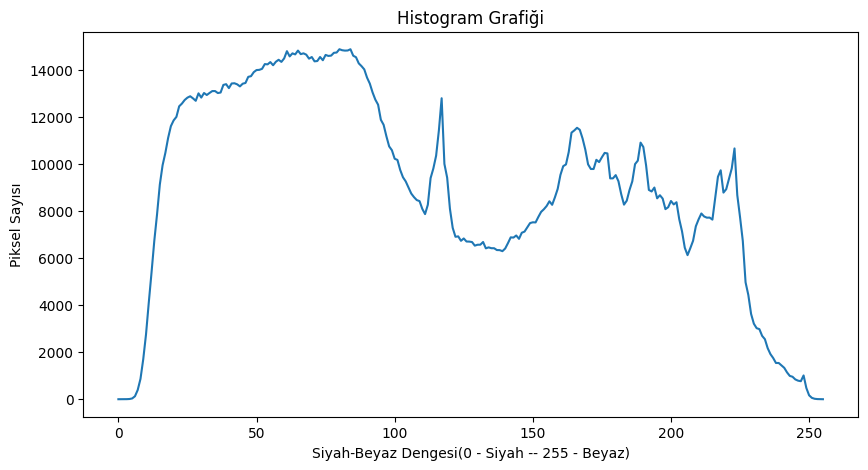


Renk Ortalaması:
[[101.23915842]
 [120.2949974 ]
 [ 94.69910807]]
Renk Standart Sapması:
[[81.43643393]
 [62.22780161]
 [67.39503701]]


In [27]:
# Görüntüyü gri tonlamalı hale getir
gray_image = cv.imread('/kaggle/input/test-images/alaska_range_beautiful_mountain_landscape-wallpaper-1920x1200.jpg')
gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

# Görüntü histogramını hesapla
hist = cv.calcHist([gray_image], [0], None, [256], [0, 256])

# Görüntü üzerinde renk istatistiklerini hesapla
mean, std_dev = cv.meanStdDev(image)

# Histogramı ve renk istatistiklerini görüntüle
plt.figure(figsize=(10,5))
plt.plot(hist)
plt.xlabel('Siyah-Beyaz Dengesi(0 - Siyah -- 255 - Beyaz)')
plt.ylabel('Piksel Sayısı')
plt.title('Histogram Grafiği')
plt.show()

print("\nRenk Ortalaması:")
print(mean)
print("Renk Standart Sapması:")
print(std_dev)

## Çerçeveleme

`cv.BORDER_X` bu şekilde yazdığımızda('X' değişken olmasını ifade ediyor) birçok çeşit çerçeveleme şekline erişebiliriz. Kendiniz değerlerle ve çerçeve tipleriyle oynama yaparak denemeler yapabilirsiniz.

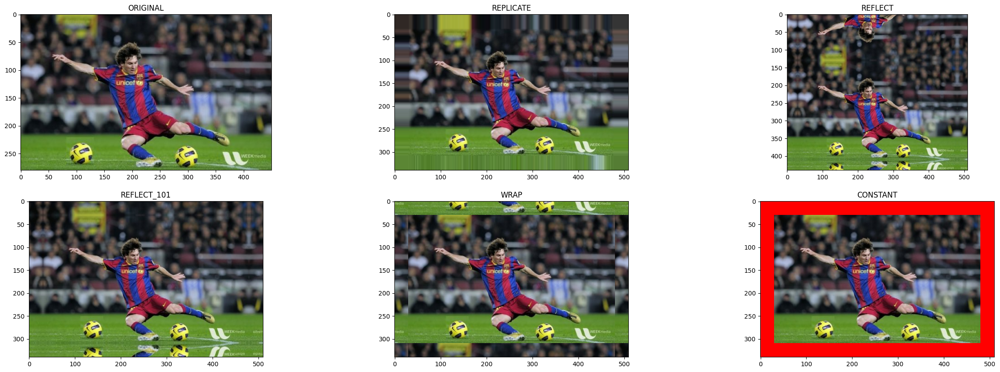

In [28]:
img = cv.imread('/kaggle/input/test-images/roi.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
# Çerçeve rengi
red = [255, 0, 0]

replicate = cv.copyMakeBorder(img,30,30,30,30,cv.BORDER_REPLICATE)
reflect = cv.copyMakeBorder(img,130,30,30,30,cv.BORDER_REFLECT)
reflect101 = cv.copyMakeBorder(img,30,30,30,30,cv.BORDER_REFLECT_101)
wrap = cv.copyMakeBorder(img,30,30,30,30,cv.BORDER_WRAP)
constant= cv.copyMakeBorder(img,30,30,30,30,cv.BORDER_CONSTANT,value=red) # Burada resmin piksellerini kullanmadığı için olmasını istediğimi çerçeve rengini veriyoruz.

plt.figure(figsize=(30, 10))

plt.subplot(231),plt.imshow(img,'gray'),plt.title('ORIGINAL')
plt.subplot(232),plt.imshow(replicate,'gray'),plt.title('REPLICATE')
plt.subplot(233),plt.imshow(reflect,'gray'),plt.title('REFLECT')
plt.subplot(234),plt.imshow(reflect101,'gray'),plt.title('REFLECT_101')
plt.subplot(235),plt.imshow(wrap,'gray'),plt.title('WRAP')
plt.subplot(236),plt.imshow(constant,'gray'),plt.title('CONSTANT')
plt.show()

## Geometrik İşlemler

- Scaling (Büyütme-Küçültme)
- Translation
- Rotation
- Affine Transformation
- Perspective Transformation



### Scaling (Büyütme-Küçültme)

Resimlerin boyutlarını ayarlamak için OpenCV'nin `resize()` methodunu kullanmamız gerekiyor. Bu metot; resmi, yeni boyutunu, ve interpolation(enterpolasyon) yöntemini parametre olarak alır. Interpolasyon resim büyüdüğünde ya da küçüldüğünde piksellerin yeni değerlerini hesaplama yöntemidir. 

- Interpolation Çeşitleri:
    1. INTER_CUBIC --> Genellikle 2 kat büyütme gibi hem ende hem boyda aynı oranda büyütme ve küçültmelerde kullanılır.
    2. INTER_LINEAR --> Daha hızlı sonuç verir. Sonuçları kalitelidir.
    3. INTER_NEAREST --> En hızlı yöntemdir fakat özellikle zoom yapılıp incelendiğinde keskin geçişlere sebep olabilir. Görüntü kalitesi bu yöntemde öncelikli değildir.
    


Resmin boyutu:  (280, 450, 3)
Resmin yeni boyutu:  (560, 900, 3)


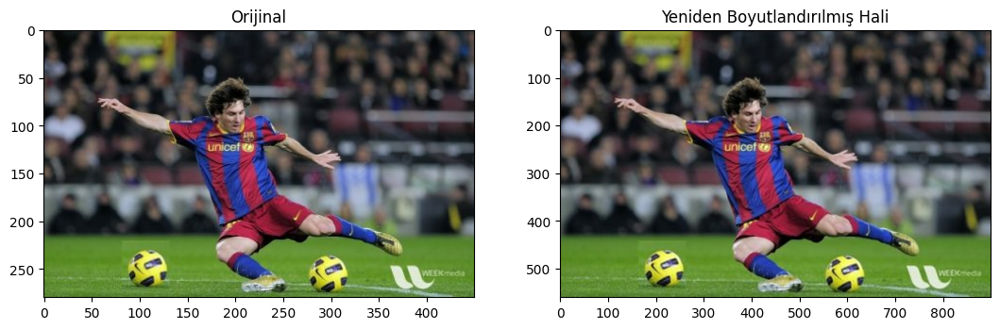

In [29]:
image = cv.imread('/kaggle/input/test-images/roi.jpg')
image = cv.cvtColor(image, cv.COLOR_BGR2RGB)

height, width = image.shape[:2]

# Diğer çeşitleri denemek için sadece parametre değiştir
resized_img = cv.resize(image, (2 * width, 2 * height), interpolation = cv.INTER_CUBIC)

print('Resmin boyutu: ',image.shape)
print('Resmin yeni boyutu: ', resized_img.shape)

plt.figure(figsize=(20,10))
plt.subplot(231)
plt.imshow(image)
plt.title('Orijinal')
plt.subplot(232)
plt.imshow(resized_img) 
plt.title('Yeniden Boyutlandırılmış Hali')
plt.show()

### Translation (Dönüşüm)

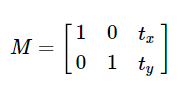

Translation işlemi resmi kaydırmaya denir. Eğer (x,y) kayma yönüyse; (Tx,Ty), 'x' ve 'y' değişkenlerine bağlı tanımlanır. Bu da üstteki M matriksine karşılık gelir.
Örneğin bir resmi sağa doğru 100 piksel(100,0), aşağıya doğru 50 piksel(0,50) kaydıralım. Yani, (x,y) = (100,50) olur. `warpAffine` matrise göre resme değişiklikleri uygulayan bir methoddur.

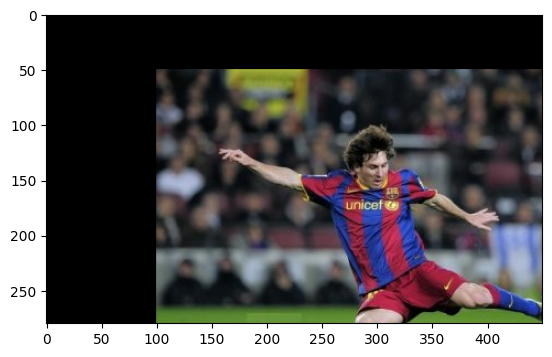

In [30]:
image = cv.imread('/kaggle/input/test-images/roi.jpg')
image = cv.cvtColor(image, cv.COLOR_BGR2RGB)

rows, cols = image.shape[:2]

M = np.float32([[1,0,100],[0,1,50]])  # Burada açıklamadaki matrisi oluşturuyoruz.
image_dst = cv.warpAffine(image, M, (cols, rows))

plt.imshow(image_dst)

## Rotation (Döndürme)
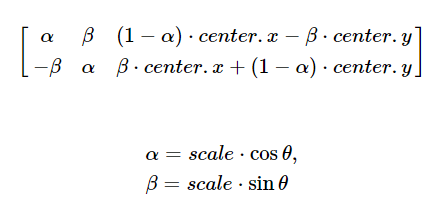

`getRotationMatrix2D` methodu bu matrikse göre hesaplama yapar ve bir matriks oluşturur. Sonrasında yine `warpAffine` methodu oluşan matrikse göre piksellerin yeni konumunu hesaplar.

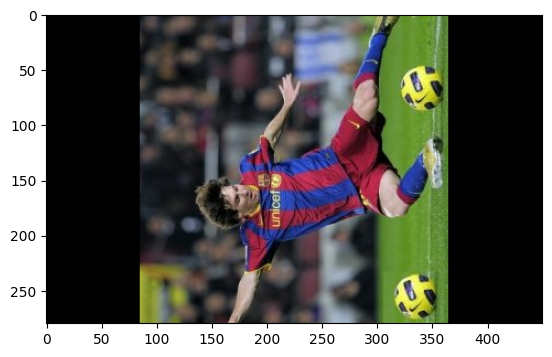

In [31]:
image = cv.imread('/kaggle/input/test-images/roi.jpg')
image = cv.cvtColor(image, cv.COLOR_BGR2RGB)

rows, cols = image.shape[:2]

M = cv.getRotationMatrix2D(((cols-1)/2.0,(rows-1)/2.0),90,1)
image_dst = cv.warpAffine(image,M,(cols,rows))
plt.imshow(image_dst)

Görüldüğü gibi resmin eni ve boyu birbiri ile aynı olmadığı için resimde kayıplar yaşandı. Bunu engellemek için resmin büyük olan(eni ya da boyu) boyutunu alarak bir siyah kare oluştururuz ve resmi bu kareye yerleştirdikten sonra döndürme yaptığımızda kayıp yaşamamızı sağlarız. Fakat bu sadece 90 derece ve katlarında döndürme yapmamız durumunda çalışır.

- Pratik: Geçen derslerde öğrendiğiniz numpy bilgisi ile bu sorunu çözebilirsiniz. Yani herhangi bir açı döndürüldüğünde resimde kayıplar yaşanmaması sağlayamayı deneyiniz. (Orta) (İpucu: Köşegen Kullanın)

- Pratik: Aynı işlemi Translation(Dönüşüm) için de yapmayı deneyebilirsiniz. (Kaydırma yaptığınız tarafa doğru çerçeveyi genişletebilirsiniz)

In [32]:
image.shape # Buradan anlıyoruz ki 450x450 lik bir kare oluşturmalıyız.

(280, 450, 3)

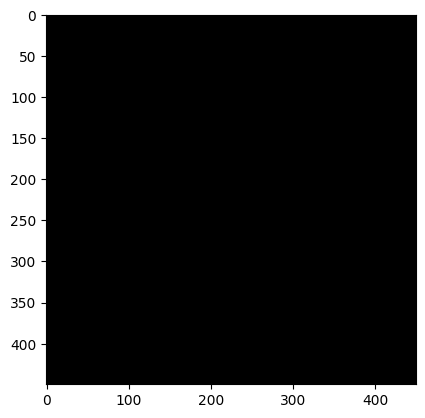

In [33]:
# RGB değerleri 0-255 aralığında olduğu için oluşturduğumuz matriksin değer tipini unsigned-integer-8 seçiyoruz
# 8, 8-bitlik olduğunu ifade eder. Yani maksimum tuttuğu sayı aralığı [0,255] idir.
black_square = np.zeros((450,450,3), dtype=np.uint8) 
plt.imshow(black_square)

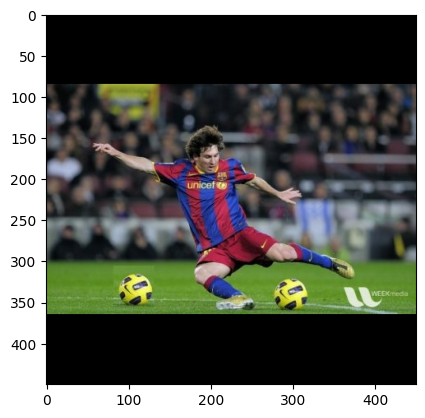

In [34]:
origin = int(450-280/2) # burada resmi yerleştirmeye başlayacağımız konumu seçiyoruz 
# 280x450 resmi 450x450 siyah arka planın içine yerleştirin
x_offset = (black_square.shape[1] - image.shape[1]) // 2
y_offset = (black_square.shape[0] - image.shape[0]) // 2
black_square[y_offset:y_offset + image.shape[0], x_offset:x_offset + image.shape[1]] = image

plt.imshow(black_square)

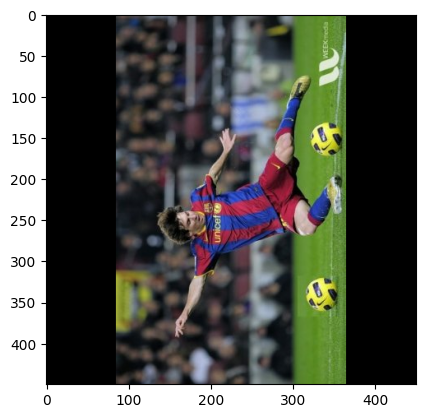

In [35]:
# Şimdi döndürme işlemini tekrar uygulayalım
rows, cols = black_square.shape[:2]

M = cv.getRotationMatrix2D(((cols-1)/2.0,(rows-1)/2.0),90,1)
image_dst_square = cv.warpAffine(black_square,M,(cols,rows))
plt.imshow(image_dst_square)

Gördüğünüz gibi resimden bir kayıp yaşamadık.

- Pratik: Resimdeki siyah bölgeleri çıkartıp sadece resmin döndürülmüş halini elde etmeye çalışın. (Kolay)

## Affine Transformation (Afin Dönüşümü)

Afin dönüşümde, orijinal görüntüdeki tüm paralel çizgiler, çıktı görüntüsünde hala paralel olacaktır. Dönüşüm matrisini bulmak için giriş görüntüsündeki üç noktaya ve bunların çıkış görüntüsündeki karşılık gelen konumlarına ihtiyacımız var. Daha sonra `cv.getAffineTransform`, `cv.warpAffine`'e aktarılacak 2x3'lük bir matris oluşturacaktır.

`pts1`: İlk nokta kümesi `pts1` orijinal görüntüdeki dönüşümün temel noktalarını ifade eder. Bu noktalar, dönüşüm işlemi sırasında sabit kalır ve diğer noktaların bu noktalara göre dönüşmesini sağlar. Bu noktalar dönüşümün referans noktalarıdır.

`pts2`: İkinci nokta kümesi `pts2` ise orijinal noktaların dönüşüm sonucu yeni konumlarını ifade eder. Yani, pts1 ile belirtilen orijinal noktalar, dönüşüm sonucu `pts2` ile belirtilen yeni konumlara taşınır.

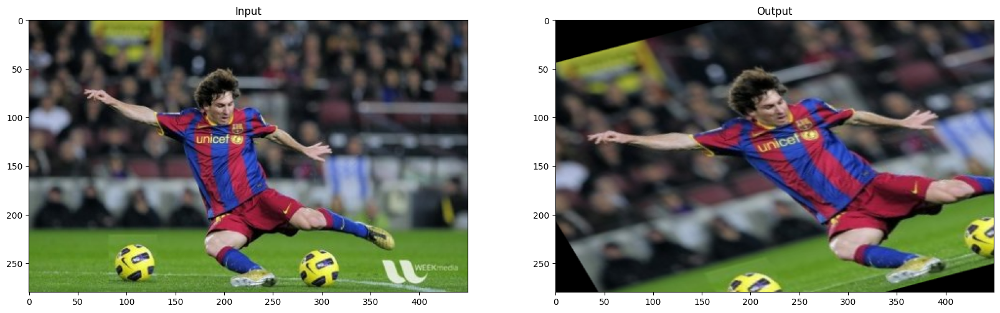

In [36]:
image = cv.imread('/kaggle/input/test-images/roi.jpg')
image = cv.cvtColor(image, cv.COLOR_BGR2RGB)

rows,cols = image.shape[:2]

pts1 = np.float32([[50,50],[200,50],[50,200]])
pts2 = np.float32([[10,100],[200,50],[100,250]])

M = cv.getAffineTransform(pts1,pts2)
image_dst = cv.warpAffine(image,M,(cols,rows))

plt.figure(figsize=(20,10))
plt.subplot(121),plt.imshow(image),plt.title('Input')
plt.subplot(122),plt.imshow(image_dst),plt.title('Output')
plt.show()

Bunu yaparak görüntüleri bilerek bozuyoruz ki model eğitiminde veri setini daha etkili ve zengin hale getirebilelim.

## Perspective Tranformation (Persfektif Dönüşümü)

Bu dönüşümü yapabilmek için öncelikle `pts1` nokta kümesini yani resim üzerinde neyi alacaksak onun 4 köşesinin yerini belirten bir nokta kümesini oluşturmalıyız. Sonrasında `pts2` nokta kümesini yani `pts1` nokta kümesinin işaretlediği bölgeyi nasıl bir boyutun içerisine dönüşümünü sağlayacaksak o şeklin boyutlarını girmemiz gerekiyor. Devamında ise `getPerspectiveTransform` methodu bu nokta kümelerine göre bir dönüşüm matriksi oluşturur ve `warpPerspective` methodu ile resmin bu oluşan matrikse göre uyarlanmış halini elde ederiz.

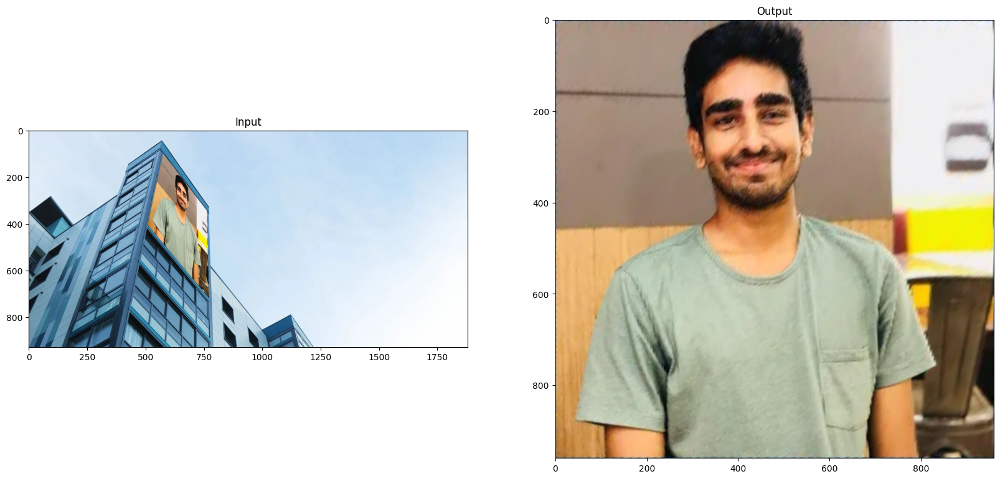

In [37]:
image = cv.imread('/kaggle/input/test-images/1_0Jne3K4IeO7v58ItBrZBMA.jpg')
image = cv.cvtColor(image, cv.COLOR_BGR2RGB)

rows,cols = image.shape[:2]

pts1 = np.float32([[575,97],[763,343],[509,404],[771,716]]) # Bu nokta kümesi orijinal resimdeki almak istediğimiz bölgenin koordinatlarıdır.
pts2 = np.float32([[0,0],[960,0],[0,960],[960,960]]) # Bu nokta kümesi ise ortaya çıkacak resmin boyutlarını belirten matristir.

M = cv.getPerspectiveTransform(pts1,pts2)
image_dst = cv.warpPerspective(image,M,(960,960))

plt.figure(figsize=(20,10))
plt.subplot(121),plt.imshow(image),plt.title('Input')
plt.subplot(122),plt.imshow(image_dst),plt.title('Output')
plt.show()

- Pratik: Kendiniz bulduğunuz bir fotoğraftaki yamuk bir görüntüyü üstteki örnekte olduğu gibi düzeltmeye çalışın. (Orta)
    * Resmin koordinatlarını bulmak için sizi uğraştırabilir.

# **Ödev**

Orijinali altta görünen görüntüyü yine altta görünen görüntüye dönüştürmeyi deneyin. İpucu: 3 işlem yapmanız gerekiyor(BGR2RGB dönüşümü hariç). Aynısını yapmak değerlerden dolayı zor olacaktır. O yüzden benzetmeye çalışmanız yeterli :)

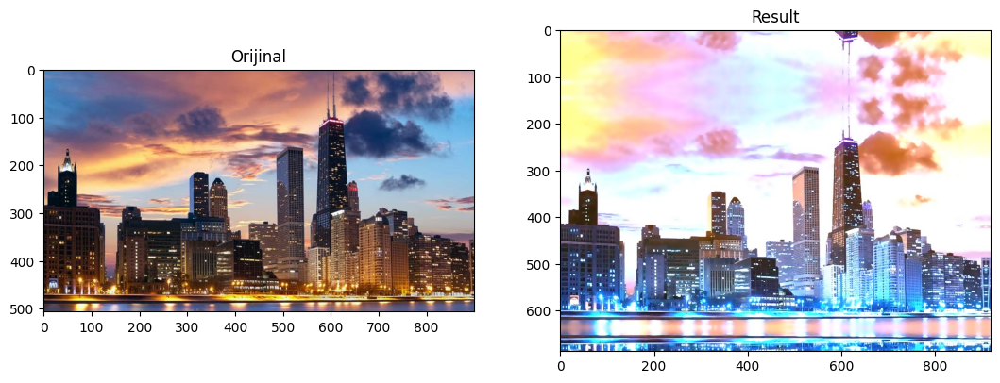

In [38]:
img_orijinal = cv.imread('/kaggle/input/test-images/chicago_skyline_16x9.jpg')
img_result = cv.imread('/kaggle/input/test-images/odev_result_chicago.jpg')

img_orijinal = cv.cvtColor(img_orijinal, cv.COLOR_BGR2RGB)
img_result = cv.cvtColor(img_result, cv.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.subplot(231)
plt.imshow(img_orijinal)
plt.title('Orijinal')
plt.subplot(232)
plt.imshow(img_result)
plt.title('Result')
plt.show()

# 2. Video İşlemleri

Bu kısım VS Code üzerinden gösterilecek. Çünkü `cv2` kütüphanesinin fonksiyonları olan `cv2.imshow()` ve `cv2.cap.read()` jupyter notebook içerisinde çalışmıyor. 